<a href="https://colab.research.google.com/github/anila-1905/LGMVIP-DataScience/blob/main/LMG_TASK2_Exploratory_Data_Analysis_on_Dataset_Terrorism_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**LET'S GROW MORE : DATA SCIENCE VIRTUAL INTERNSHIP PROGRAM** 

#**Author**: - **J.Sai Aneela Chowdary**

#**Intermediate Level Task 2**

# **Batch: November 2021**


#  **Title: Exploratory Data Analysis on Dataset - Terrorism**


Aim As a security/defense analyst, We have try to find out the hot zone of terrorism.

data sets : - https://drive.google.com/file/d/1luTU7xBvI7QAGPbQMxEHcgKUi9d6UeP_/view

# **STEP 1 :- Importing  libraries**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import numpy as np
plt.style.use('fivethirtyeight')
!pip install plotly
import plotly.offline as py
py.init_notebook_mode(connected=True)

In [ ]:
import plotly.graph_objs as go
import plotly.tools as tls
!pip install folium
import folium
import folium.plugins
from matplotlib import animation,rc
import io
import base64
from IPython.display import HTML, display

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import codecs
from subprocess import check_output
print(check_output(["ls"]).decode("utf8"))

sample_data



# **Step 2   :-  Importing The Data**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
terror=pd.read_csv('/content/drive/MyDrive/Global Terrorism - START data.csv',encoding='ISO-8859-1', engine="python", error_bad_lines=False)
terror.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed','nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type','weaptype1_txt':'Weapon_type','motive':'Motive'},inplace=True)
terror=terror[['Year','Month','Day','Country','Region','city','latitude','longitude','AttackType','Killed','Wounded','Target','Summary','Group','Target_type','Weapon_type','Motive']]
terror['casualities']=terror['Killed']+terror['Wounded']
terror.head()

,Year,Month,Day,Country,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive,casualities
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,1.0
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,0.0
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN,1.0
3,1970,1,0,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives,NaN,NaN
4,1970,1,0,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary,NaN,NaN


#  **Step 3   :-  Cleaning The Data**

In [ ]:
print('Country with Highest Terrorist Attacks:',terror['Country'].value_counts().index[0])
print('Regions with Highest Terrorist Attacks:',terror['Region'].value_counts().index[0])
print('Maximum people killed in an attack are:',terror['Killed'].max(),'that took place in',terror.loc[terror['Killed'].idxmax()].Country)

Country with Highest Terrorist Attacks: Iraq
Regions with Highest Terrorist Attacks: Middle East & North Africa
Maximum people killed in an attack are: 1570.0 that took place in Iraq


# **Task 4 Number of terrorist activities over years**

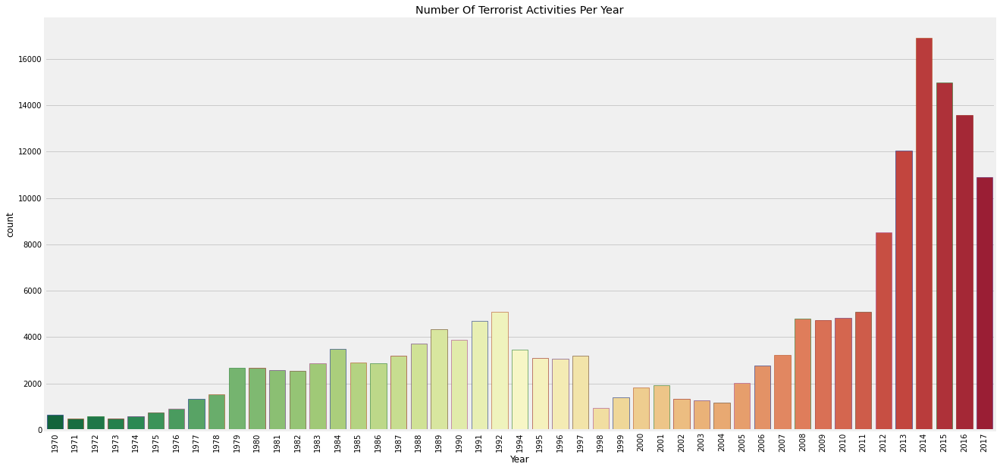

In [ ]:
plt.subplots(figsize=(20,10))
sns.countplot('Year',data=terror,palette='RdYlGn_r',edgecolor=sns.color_palette('dark',7))
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities Per Year')
plt.show()

# **Step 5:- Different attacking methods used by the terrorist**

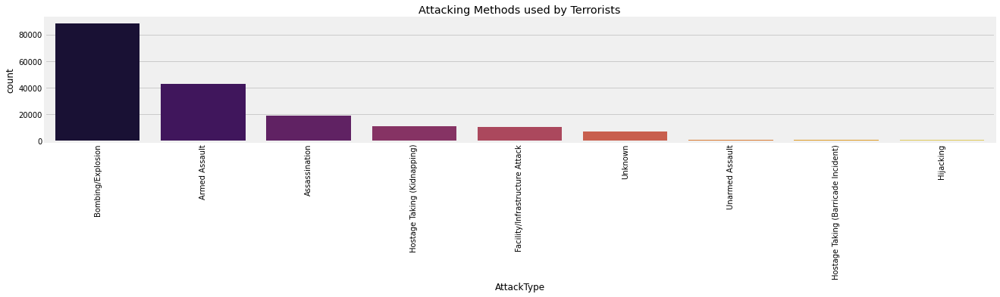

In [ ]:
plt.subplots(figsize=(20,3))
sns.countplot('AttackType',data=terror,palette='inferno',order=terror['AttackType'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Attacking Methods used by Terrorists')
plt.show()

# **Step 6 :- Type of people targeted by the terrorist**

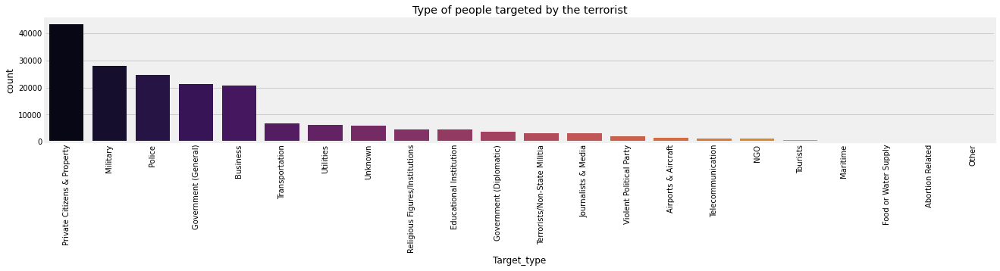

In [ ]:
plt.subplots(figsize=(20,3))
sns.countplot(terror['Target_type'],palette='inferno',order=terror['Target_type'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Type of people targeted by the terrorist')
plt.show()

In [ ]:
terror_fol=terror.copy()

terror_fol.dropna(subset=['latitude','longitude'],inplace=True)

location_fol=terror_fol[['latitude','longitude']][:5000]

country_fol=terror_fol['Country'][:5000]

city_fol=terror_fol['city'][:5000]

killed_fol=terror_fol['Killed'][:5000]

wound_fol=terror_fol['Wounded'][:5000]

def color_point(x):
    if x>=30:
        color='red'
    elif ((x>0 and x<30)):
        color='blue'
    else:
        color='green'
    return color   
def point_size(x):
    if (x>30 and x<100):
        size=2
    elif (x>=100 and x<500):
        size=8
    elif x>=500:
        size=16
    else:
        size=0.5
    return size   

map2 = folium.Map(location=[30,0],tiles='CartoDB dark_matter',zoom_start=2)
for point in location_fol.index:

    info='<b>Country: </b>'+str(country_fol[point])+'<br><b>City: </b>: '+str(city_fol[point])+'<br><b>Killed </b>:'+str(killed_fol[point])+'<br><b>Wounded</b> : '+str(wound_fol[point])
  
    iframe = folium.IFrame(html=info, width=200, height=200)
  
    folium.CircleMarker(list(location_fol.loc[point].values),popup=folium.Popup(iframe),
                        radius=point_size(killed_fol[point]),color=color_point(killed_fol[point])).add_to(map2)
map2

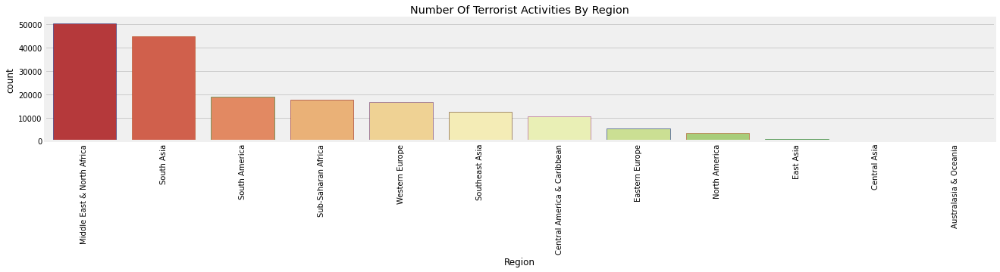

In [ ]:
plt.subplots(figsize=(20,3))
sns.countplot('Region',data=terror,palette='RdYlGn',edgecolor=sns.color_palette('dark',7),order=terror['Region'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities By Region')
plt.show()

# **STEP 7 :- Top countries affected by terrorism**

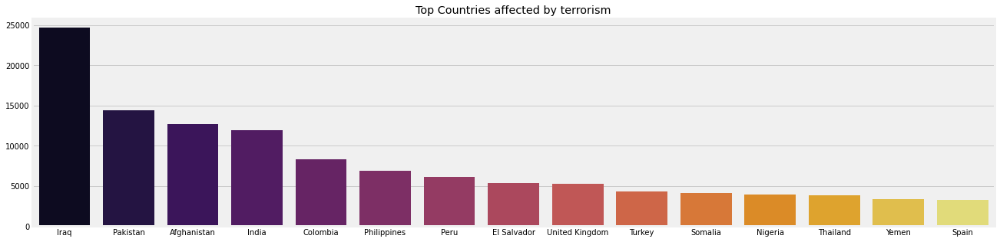

In [ ]:
plt.subplots(figsize=(20,5))
sns.barplot(terror['Country'].value_counts()[:15].index,terror['Country'].value_counts()[:15].values,palette='inferno')
plt.title('Top Countries affected by terrorism')
plt.show()

# **STEP 8 :-  Terrorist Groups with Highest Terror Attacks**

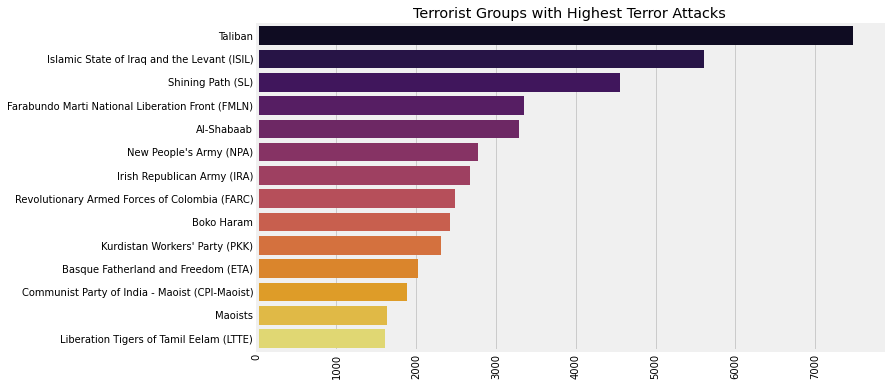

In [ ]:
sns.barplot(terror['Group'].value_counts()[1:15].values,terror['Group'].value_counts()[1:15].index,palette=('inferno'))
plt.xticks(rotation=90)
fig=plt.gcf()
fig.set_size_inches(10,6)
plt.title('Terrorist Groups with Highest Terror Attacks')
plt.show()

## ......................................**THANK YOU** ........................................